<a name="top"></a>
<div style="width:1000 px">

<div style="float:right; width:98 px; height:98px;">
<img src="https://cdn.miami.edu/_assets-common/images/system/um-logo-gray-bg.png" alt="Miami Logo" style="height: 98px;">
</div>

<h2>Movable MSEplot probe in a ZIDV-extracted data cube</h2>
<h3>Drilling down into the science of:</h3>

Mapes, Cheedela, Igel, Tsai 2019: The dynamics of water vapor islands over the western equatorial Indian ocean. In preparation

<div style="clear:both"></div>
</div>

<hr style="height:2px;">

<img src="https://weather.rsmas.miami.edu/repository/metadata/view/Igel_WEIO_case_2007-08-13.gif?element=1&entryid=8a37bae6-b457-40ae-b212-1464bb9aebc2&metadata.id=6ea22cf3-c8d7-4a0d-9cb6-a198b60efb9f" alt="Case Preview" align="right" style="height: 400px;width:600">
## Event: 2007-08-13
### Steps in the analysis 
1. <a href="#import">Load the dataset</a>
1. <a href="#compare">Compare CWV of MERRA and ERAI</a>
1. <a href="#probe">Movable probe on a CWV backdrop image</a>

In [12]:
import xarray as xr, hvplot.xarray, cartopy, cartopy.crs as crs, holoviews as hv, geoviews as gv
import numpy as np, metpy, metpy.calc as mpcalc, matplotlib.pyplot as plt, pandas as pd 

from metpy.units import units as mpunits
from MSEplots import plots as mpt
from functools import partial

np.warnings.filterwarnings('ignore') # otherwise metpy creates a ton of them

print('Library versions:\n')
print({'xarray':xr.__version__,'metpy':metpy.__version__,
       'geoviews':gv.__version__,'cartopy':cartopy.__version__})
print('\nInstall libraries:\n' 
      '             conda install holoviews geoviews hvplot -c pyviz\n'
      '             conda install matplotlib xarray cartopy -c conda-forge\n'
      '             pip install metpy MSEplots-pkg\n')

Library versions:

{'xarray': '0.11.2', 'metpy': '0.8.0', 'geoviews': '1.6.2', 'cartopy': '0.17.0'}

Install libraries:
             conda install holoviews geoviews hvplot -c pyviz
             conda install matplotlib xarray cartopy -c conda-forge
             pip install metpy MSEplots-pkg



<a name="import"></a>
---------
## Load the bundled (zidv) dataset for the case
#### Download and provide path or chose the download link from here [Igel long-lived "water vapor island" cases -- Repository](http://weather.rsmas.miami.edu/repository/entry/show?entryid=cea25c8d-b05a-4d47-aa2b-bdb06c5453b2)

In [13]:
#zidvfile = 'https://weather.rsmas.miami.edu/repository/entry/get/Igel_WEIO_case_2007-08-13.zidv?entryid=8a37bae6-b457-40ae-b212-1464bb9aebc2'
zidvfile = '/Users/bem/Jupyter/Igel_WEIO_case_2007-08-13.zidv'

#### A utility to open the local or remote dataset

In [14]:
from os.path import isfile, join
from zipfile import ZipFile
import xarray
from io import BytesIO
from urllib.request import urlopen
def from_zidv(fileorurl=None,outdir=None):
    """Loading data from IDV zip file '.zidv' as xarray Dataset
    fileorurl can be a local .zidv file or a remote url.
    Optionally, outdir can be specified where the file is unzipped"""
    if fileorurl.startswith('http'):
        zfile = urlopen(fileorurl)
        zfile = BytesIO(zfile.read())
    elif isfile(fileorurl):
        zfile=fileorurl
    else:
        return 'Unknown File or Url'
    das=dict()
    with ZipFile(zfile) as zip_file:
        for contained_file in zip_file.namelist():
            if str(contained_file).startswith('data'):
                try:
                    das.update({contained_file:xarray.open_dataset(zip_file.extract(contained_file,outdir))})
                except Exception as err:
                    print('Skipping file '+str(contained_file)+' because of error '+err)
    return das
xarray.from_zidv=from_zidv

In [15]:
datasets_in_zidv=xr.from_zidv(zidvfile)
datasets_in_zidv.keys() #keys of datasets in xidv file

dict_keys(['data_0_MERRA23Ddata', 'data_1_ERAI2D3h@NCAR', 'data_2_MERRA22Dfields', 'data_3_ERAI3DatNCAR-RDA', 'data_4_GridSat-Aggregation'])

#### Load datasets and match times

In [16]:
merra2d=datasets_in_zidv['data_2_MERRA22Dfields']
merra3d=datasets_in_zidv['data_0_MERRA23Ddata']
erai2d=datasets_in_zidv['data_1_ERAI2D3h@NCAR']
erai3d=datasets_in_zidv['data_3_ERAI3DatNCAR-RDA']

#match times of all the datasets to 6h erai3d 

merra2d=merra2d.sel(time=erai3d.time) # match times of both datasets
merra3d=merra3d.sel(time=erai3d.time)

if 'time1' in erai2d.keys():
    erai2d=erai2d.rename({'time1':'time'})

erai2d=erai2d.sel(time=erai3d.time)

erai2d.time.attrs['long_name']='time' # a bug fix for hvplot

<a name="compare"></a>
## Compare CWV of MERRA and ERAI 

In [31]:
proj = crs.PlateCarree()
w, h = 500, 300 #width and height of the plots
cmap = "YlGnBu" #"PuBuGn" ##colormap 
color_range= (20,70) #range of colormap
slplevels= range(900,1100,4)
clipping = {'min': 'transparent'} # clip values less then min color_range to transparent


merra_tqvplot=merra2d.tqv.hvplot.quadmesh('lon', 'lat', width=w, height=h, projection=proj, cmap=cmap, global_extent=False, rasterize=True).redim.range(tqv=color_range).opts(clipping_colors=clipping)
merra_slpplot=(merra2d.slp/100).hvplot.contour('lon', 'lat', levels=slplevels, cmap='gray_r')

erai_tqvplot=erai2d.Total_column_water_surface.hvplot.quadmesh('lon','lat', width=w, height=h, projection=proj, cmap=cmap, global_extent=False, rasterize=True).redim.range(Total_column_water_surface=color_range).opts(clipping_colors=clipping)
erai_slpplot=(erai2d.Mean_sea_level_pressure_surface/100).hvplot.contour('lon', 'lat', levels=slplevels, cmap='gray_r')

(merra_tqvplot*merra_slpplot*gv.feature.coastline  + erai_tqvplot*erai_slpplot*gv.feature.coastline ).cols(2)

:Layout
   .DynamicMap.I  :DynamicMap   [time]
      :Overlay
         .Image.I     :Image   [lon,lat]   (tqv)
         .Contours.I  :Contours   [lon,lat]   (slp)
         .Coastline.I :Feature   [Longitude,Latitude]
   .DynamicMap.II :DynamicMap   [time]
      :Overlay
         .Image.I     :Image   [lon,lat]   (Total_column_water_surface)
         .Contours.I  :Contours   [lon,lat]   (Mean_sea_level_pressure_surface)
         .Coastline.I :Feature   [Longitude,Latitude]

<a name="probe"></a>
## Interactive MSE probe on MERRA CWV map

In [18]:
plt.ioff() # disable matplotlib plots to automatically appear in the notebook

#### A utility to return a matplotlib plot as HTML image

In [19]:
from io import BytesIO
import base64, matplotlib.pyplot as plt
def image_html():
    with BytesIO() as image:
        plt.savefig(image,format='png',bbox_inches="tight")
        imagedata= base64.encodebytes(image.getvalue()).decode('ascii')
    return f'<img src="data:image/png;base64, {imagedata}"</img>'

#### A function that returns MSEplot probe

In [66]:
def merra_mse_probe(time,lat,lon):
    """A function that will produce matplotlib plot at
       a given time,lat,lon
    """
    entrain = False # doesnt work for probes on model data -- qv<0 or qv=0 is the problem??
    
    selected_da = merra3d.sel(time=time,method='nearest').sel(lon=lon,lat=lat,method='nearest')

    T  = selected_da.t
    p  = selected_da.lev[~np.isnan(T)].values*mpunits.millibar 
    rh = selected_da.rh[~np.isnan(T)].values

    T  = T[~np.isnan(T)].values*mpunits.K
    T  = T.to(mpunits.degC)
    
    qv=mpcalc.mixing_ratio_from_relative_humidity(rh,T,p)
    qv=np.where(qv>0,qv,1e-9) # clip low or negative values
    
    plts=mpt.msed_plots(np.array(p),np.array(T),np.array(qv),altitude=[],entrain=entrain)   
    img = image_html() # magically gets html image from above call
    
    tstr = pd.to_datetime(str(time)) 
    tstr = tstr.strftime('%Y-%m-%d:%H')
    
    return hv.Div(f'<div><b>Probe at</b>: Time:{tstr} Lat:{lat:.1f} Lon:{lon:.1f}</div><div>{img}</div>') 

#### Create interactive probe plot

In [67]:
timevals = merra2d.time.values
lonmin,lonmax = merra2d.lon.values.min(),merra2d.lon.values.max()
latmin,latmax = merra2d.lat.values.min(),merra2d.lat.values.max()

#remake merra plot this time unrasterized, just to make visual feedback better
merraplot=merra2d.tqv.hvplot.quadmesh('lon', 'lat', width=w, height=h, projection=proj, cmap=cmap, global_extent=False).redim.range(tqv=color_range).opts(clipping_colors=clipping)
merraplot_50_ctr=merra2d.tqv.hvplot.contour('lon','lat',width=w,height=h, projection=proj,levels=[50],color='Black',line_width=2)

merra_tpsel=hv.streams.SingleTap(x=lonmin,y=latmin,source=merraplot) # stream that takes click(tap) locations from merraplot
merra_tpsel=merra_tpsel.rename(x='lon',y='lat')

merra_prof=hv.DynamicMap(merra_mse_probe,kdims=['time'],streams=[merra_tpsel]).redim.values(time=timevals).opts(width=300,height=400)

#### Create crossection

In [68]:
def crosssection(time , data):
    
    lons=data['xs'][0]
    lats=data['ys'][0]
    dlons=merra3d.lon.sel(lon=slice(min(lons),max(lons)))
    dlats=merra3d.lat.sel(lat=slice(min(lats),max(lats)))

    #interpolating function to find locations along the trajectory 
    m=(lats[1]-lats[0])/(lons[1]-lons[0])
    c=lats[0]-m*lons[0]
    yfn=lambda x:m*x+c
    xfn=lambda y:(y-c)/m
    
    latsx= list(map(yfn,dlons.values)) if (len(dlons) >= len(dlats)) else dlats.values
    lonsx= list(map(xfn,dlats.values)) if (len(dlons) < len(dlats)) else dlons.values
    
    
    lalo_coords=range(len(lonsx)) #or lats
    cs_dim_name='Index along direction of increasing longitude'
    
    dasel=merra3d.rh.sel(lon=xr.DataArray(lonsx,dims=cs_dim_name,coords={cs_dim_name:lalo_coords}),lat=xr.DataArray(latsx,dims=cs_dim_name,coords={cs_dim_name:lalo_coords}),method='nearest')
    lonst,latst=dasel.lon.values[0],dasel.lat.values[0]
    lonse,latse=dasel.lon.values[-1],dasel.lat.values[-1]
    
    #using lat lon values from data as title
    label=f"RH Crossection from (Lon:{lonst:.1f} Lat:{latst:.1f}) to (Lon:{lonse:.1f} Lat:{latse:.1f})"
    return dasel.sel(time=time).hvplot.quadmesh(cmap='RdBu',dynamic=False,title=label).redim.range(lev=(1000,200))

In [69]:
init_lons=[[50,60]] #initialize the cross section lons
init_lats=[[0,0]]   #lats
path=hv.Path((init_lons[0],init_lats[0]),kdims=['lon','lat']).opts(active_tools=['poly_draw'],color='red',line_width=4)
init_path_data=dict(xs=init_lons,ys=init_lats)
path_stream = hv.streams.PolyDraw(name='Crossection',data=init_path_data,source=path, drag=True, show_vertices=True,num_objects=1)

merra_cs=hv.DynamicMap(crosssection,kdims=['time'],streams=[path_stream]).redim.values(time=timevals).opts(width=700,height=450)

#### Layout plot

***WARNING***: the altitude at the surface is assumed 0 meter, and altitudes are derived based on the hypsometirc equation


:Layout
   .DynamicMap.I   :DynamicMap   [time]
      :Overlay
         .QuadMesh.I  :QuadMesh   [lon,lat]   (tqv)
         .Contours.I  :Contours   [lon,lat]   (tqv)
         .Path.I      :Path   [lon,lat]
         .Coastline.I :Feature   [Longitude,Latitude]
   .DynamicMap.II  :DynamicMap   [time]
      :Div
   .DynamicMap.III :DynamicMap   [time]
      :QuadMesh   [Index along direction of increasing longitude,lev]   (rh)

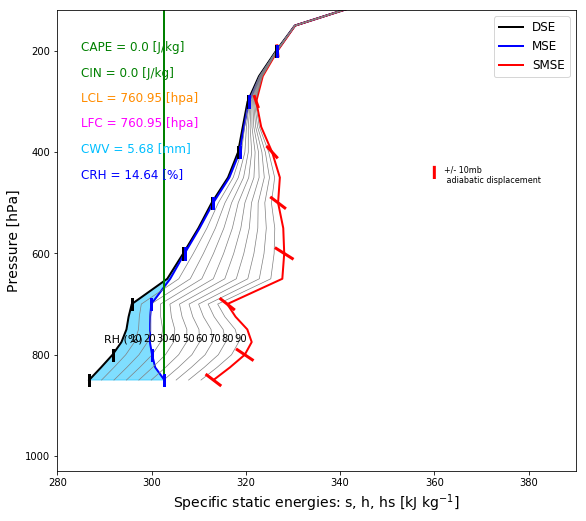

In [70]:
%%opts QuadMesh [tools=['tap','hover']] (selection_color='red' nonselection_fill_alpha=1.0)
%%opts Contours (cmap='greys')
(merraplot*merraplot_50_ctr*path*gv.feature.coastline + merra_prof + merra_cs).cols(2)